In [114]:
# I ran this notebook in Python 2.7 because of wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import random, pickle
import pandas as pd, numpy as np

%matplotlib inline

pd.options.display.max_colwidth = -1

# Load the 100 most relevant tweets for all communities and topics

In [92]:
with open('lda_top_tweets.pkl', 'rb') as pklfile:
    top_tweets = pickle.load(pklfile)

In [93]:
top_tweets.head()

,screen_name,tweet_id,name,text,community,topic
0,daphnewysham,836999249405435904,Daphne Wysham,‘Shell knew’: oil giant's 1991 film warned of ...,10,0
1,Q_petr,837028930607583232,Quercuspetr,‘Shell knew’: oil giant's 1991 film warned of ...,10,0
2,science_ooyuz,839009313582641152,Science News,'Shell Knew': Oil Giant's 1991 Film Warned of ...,10,0
3,chinorubeitp,837165600925499392,Rube,RT : ‘Shell knew’: Oil giant's 1991 film warne...,10,0
4,CLIMATECHANGE8,836557843641716740,CLIMATE CHANGE,'Shell knew': oil giant's 1991 film warned of ...,10,0


# Print wordclouds for all topics, and examine

In [107]:
# Wordcloud settings
font_path = "/Library/Fonts/DIN Condensed Bold.ttf"
wc = WordCloud(background_color="white",max_words=25,max_font_size=60, relative_scaling=.5,
                          colormap='Dark2', font_path=font_path, scale=3, collocations=False)

//anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


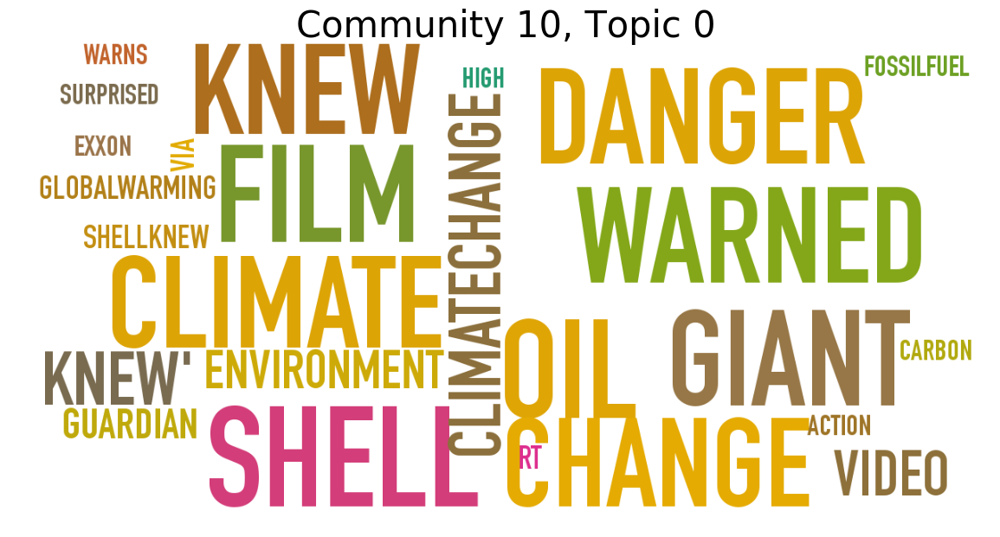

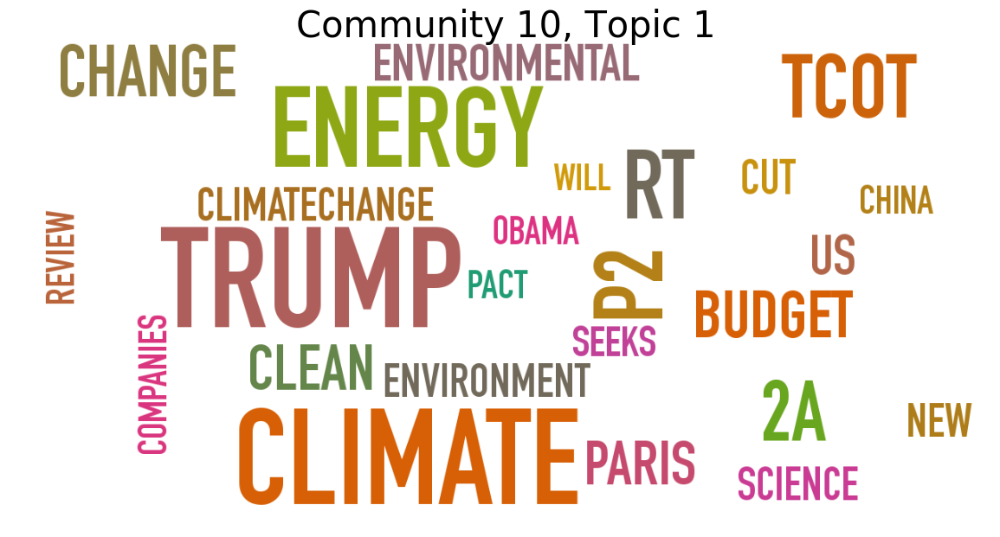

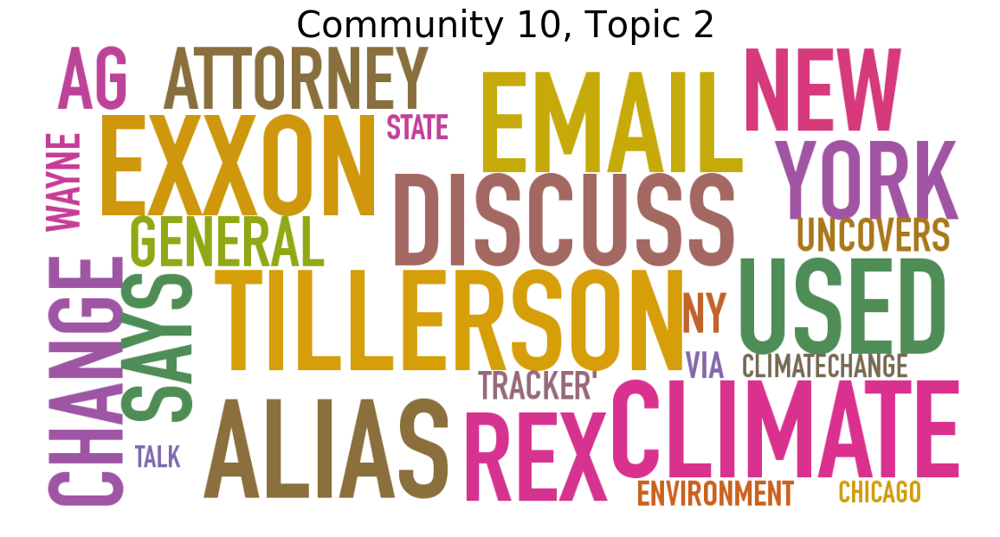

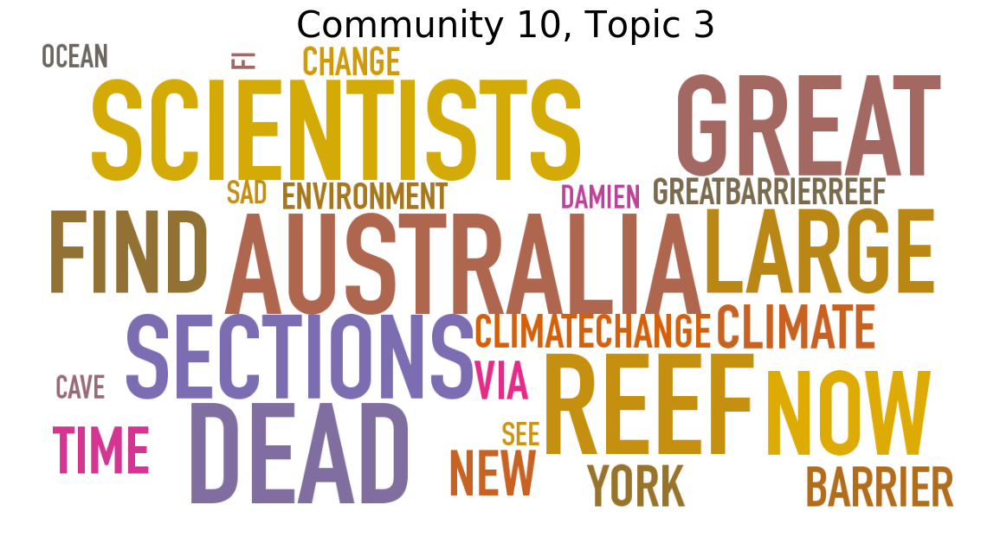

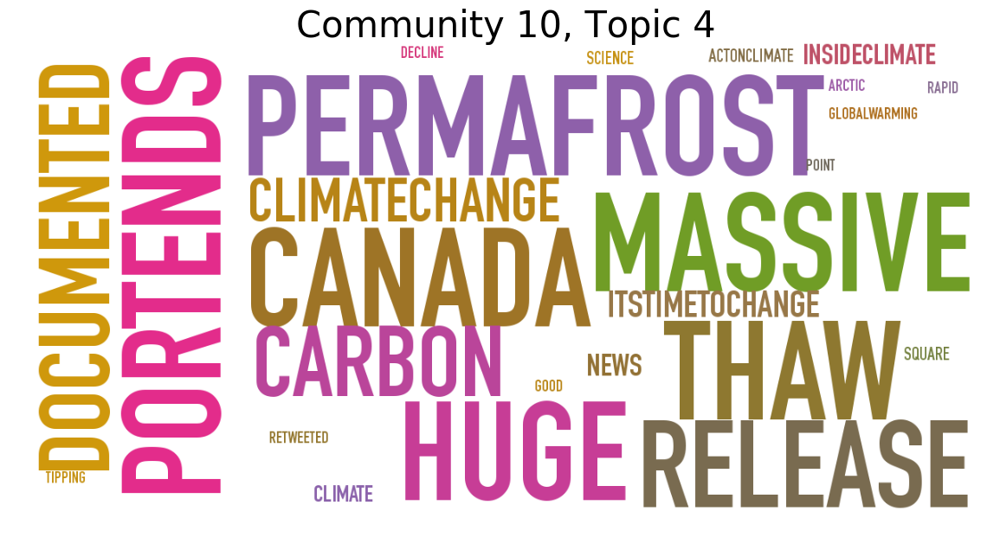

...

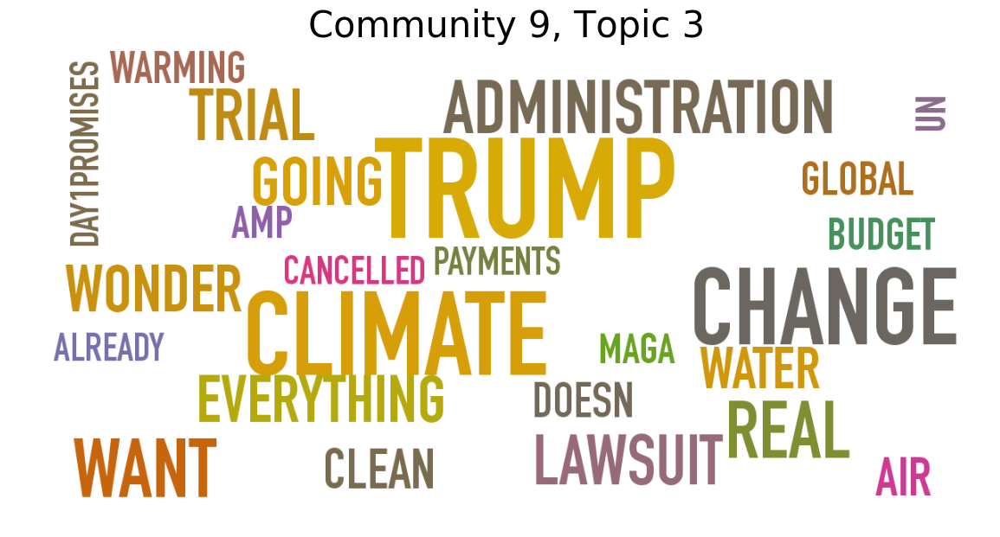

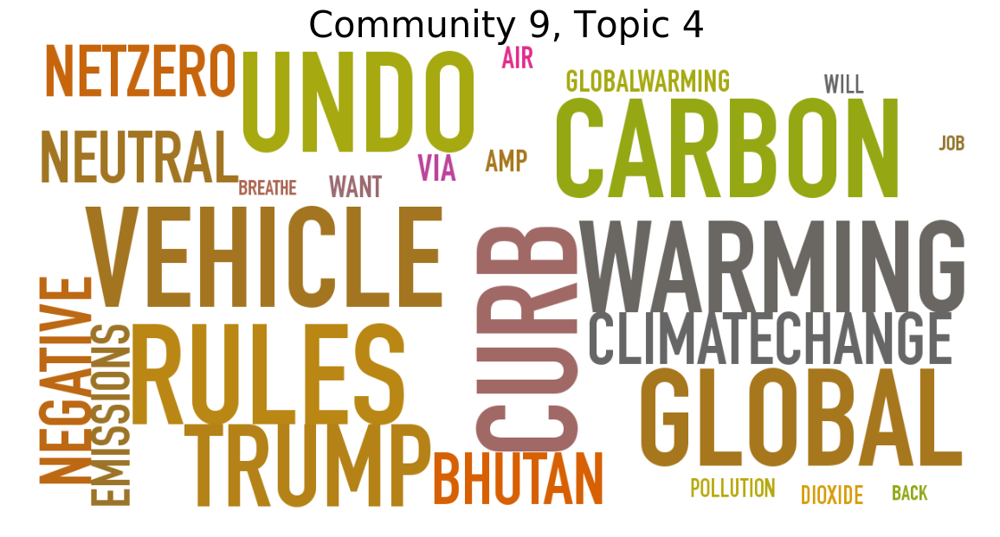

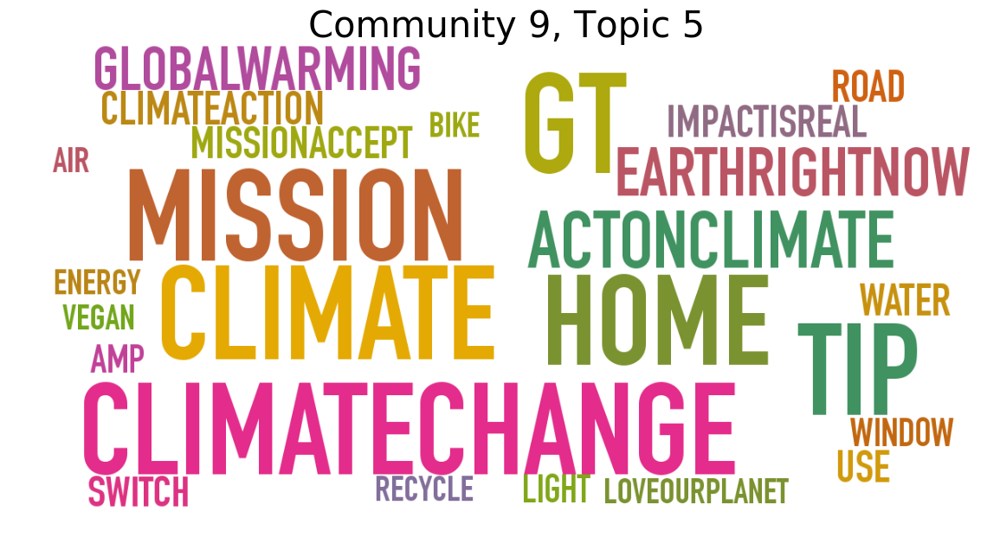

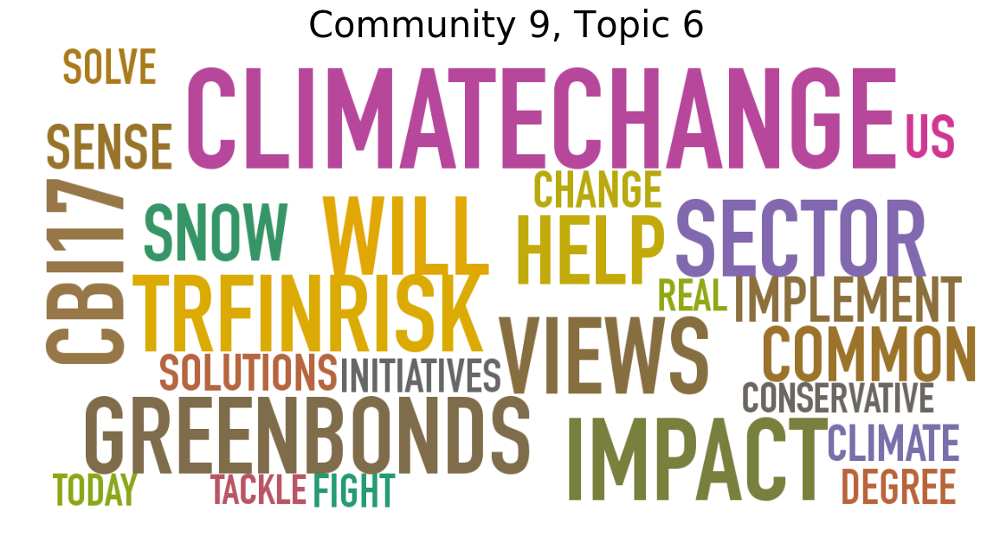

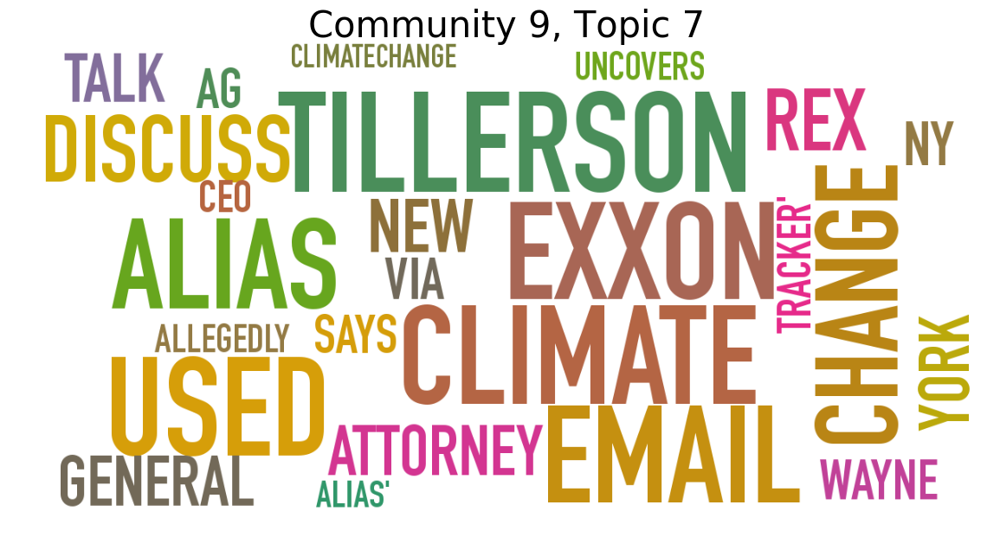

In [112]:
# Print wordclouds for all communities and topics to review
for com in top_tweets.community.unique():
    for topic in top_tweets.loc[top_tweets.community == com, 'topic'].unique():
        string = top_tweets.loc[(top_tweets.community == com) & (top_tweets.topic == topic), 'text']. \
                    str.replace(['via', '&amp'], ''). \  # Remove two unnecessary words
                    str.cat(sep=' ').upper()             # Concatenate all tweets in topic
        cloud = wc.generate(string)
        fig = plt.figure()
        fig.set_figwidth(14)
        fig.set_figheight(18)
        plt.imshow(wc)
        plt.title('Community {0}, Topic {1}'.format(com, topic), size=30)
        plt.axis('off');
        
        

# Print select wordclouds for my presentation

In [145]:
# Helper function for printing a given wordcloud
def print_word_cloud(com, topic, title):
    string = top_tweets.loc[(top_tweets.community == com) & (top_tweets.topic == topic), 'text']. \
                    str.replace('( via )|(&amp)', ''). \
                    str.cat(sep=' ').upper()
    cloud = wc.generate(string)
    fig = plt.figure()
    fig.set_figwidth(14)
    fig.set_figheight(18)
    plt.imshow(wc)
    plt.title(title, size=30).set_position([.5, 1.05])
    plt.axis('off');
        
        

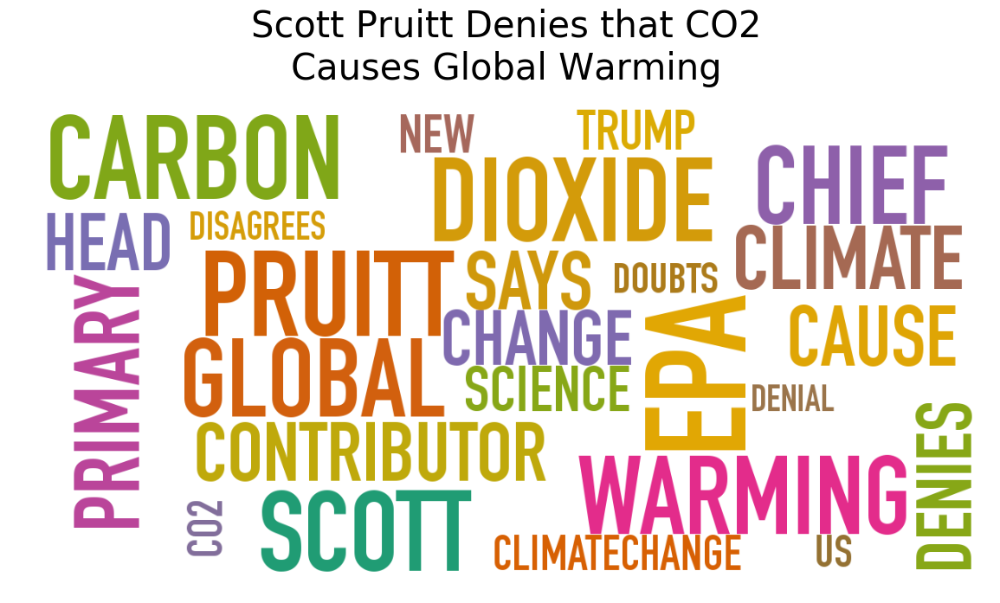

In [160]:
print_word_cloud('4', 0, 'Scott Pruitt Denies that CO2\nCauses Global Warming')

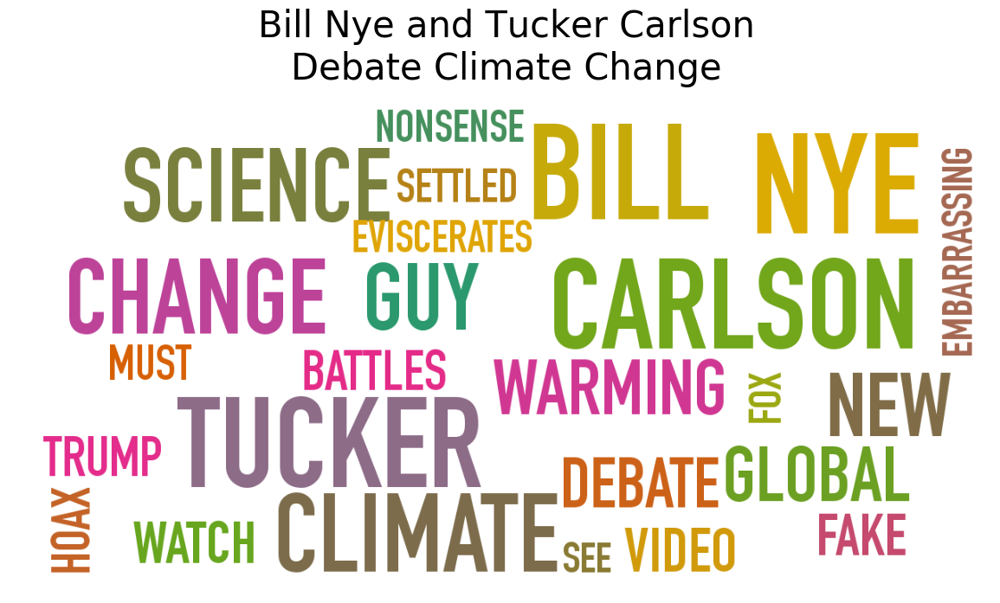

In [157]:
print_word_cloud('3', 0, 'Bill Nye and Tucker Carlson\nDebate Climate Change')

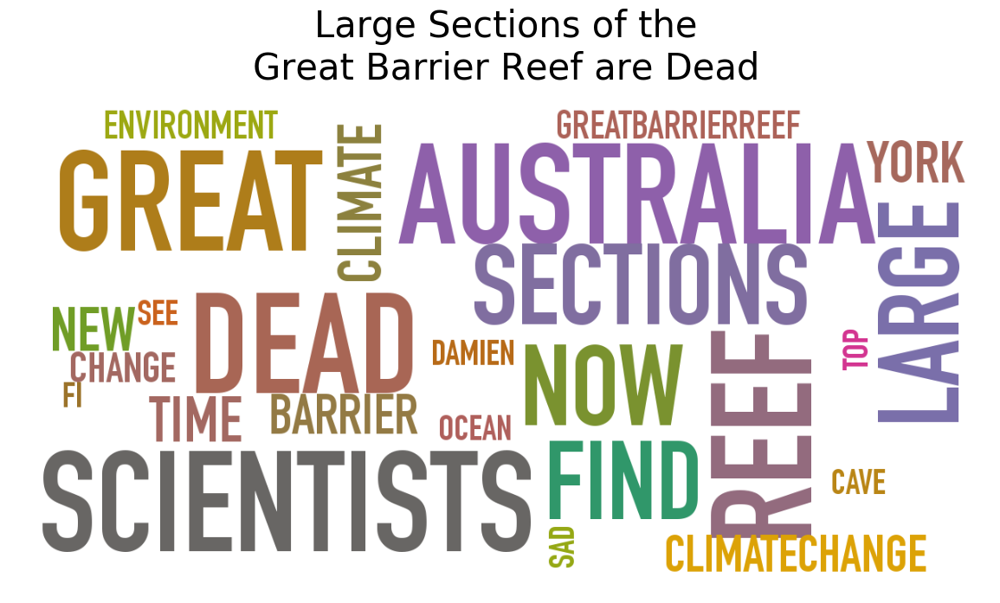

In [158]:
print_word_cloud('10', 3, 'Large Sections of the\nGreat Barrier Reef are Dead')

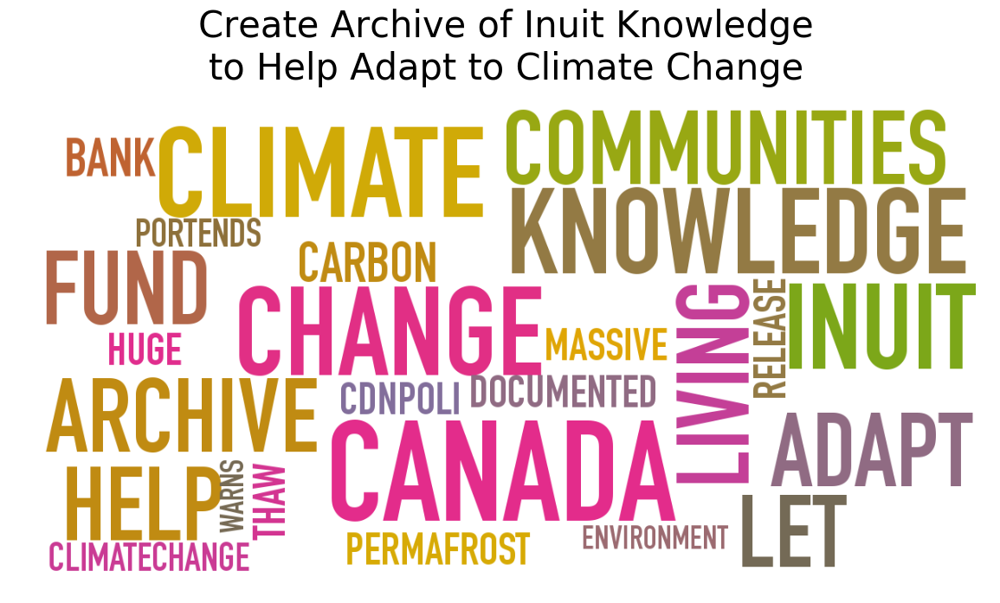

In [155]:
print_word_cloud('28', 1, 'Create Archive of Inuit Knowledge\nto Help Adapt to Climate Change')